# dl

> Deep learning based operators

In [ ]:
#| default_exp dl

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
#| export
import numpy as np
from numba import prange
from scipy.spatial import KDTree
import fpsample
import os

import onnxruntime
import importlib
from pathlib import Path
import requests
import math
import random
import moraine as mr
from moraine.utils_ import ngjit, ngpjit
from moraine.utils_ import is_cuda_available, get_array_module, get_n_cpus_avail
from moraine.chunk_ import chunkwise_slicing_mapping, chunkwise_knn_mapping
if is_cuda_available():
    import cupy as cp

In [ ]:
#| hide
import zarr

In [ ]:
#| export
def _fetch_github_file(
    gid:str, # github id
    repo:str, # github repo
    branch:str, # repo branch
    file_path:str, # path to the file
    out_path:str, # output path
):
    url = '/'.join(['https://raw.githubusercontent.com', gid, repo, 'refs','heads', branch, file_path])
    print(' '.join(['Downloading', url,'to',out_path]))
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()  # Raise an exception for bad status codes (4xx or 5xx)

        with open(out_path, 'wb') as f:
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
        print(f"File '{out_path}' downloaded successfully.")
    except requests.exceptions.RequestException as e:
        print(f"Error downloading file: {e}")

In [ ]:
#| export
def download_dl_model(
    models:str|list=None, # deep learning models to be downloaded, all available models by default
    path:str=None, # directory to save these models, inside installed Moraine package by default
):
    if models is None:
        models = ['n2f','n2fs3d','n2ft']
    else:
        if isinstance(models,str):
            models = [models,]

    if path is None: 
        path = importlib.resources.files('moraine')/'dl_model'
    else:
        path = Path(path)

    if 'n2f' in models:
        _fetch_github_file('kanglcn','n2f','main','n2f.onnx',str(path/'n2f.onnx'))
    if 'n2fs3d' in models:
        _fetch_github_file('kanglcn','n2f','main','n2fs3d.onnx',str(path/'n2fs3d.onnx'))
    if 'n2ft' in models:
        _fetch_github_file('kanglcn','n2ft','main','n2ft.onnx',str(path/'n2ft.onnx'))
        _fetch_github_file('kanglcn','n2ft','main','n2ft.onnx.data',str(path/'n2ft.onnx.data'))

Deep learning models have to be installed before use, download them by:

In [ ]:
download_dl_model()

File '/work/projects/jinwook/radarlab/kangl/moraine/moraine/dl_model/n2f.onnx' downloaded successfully.
File '/work/projects/jinwook/radarlab/kangl/moraine/moraine/dl_model/n2fs3d.onnx' downloaded successfully.
File '/work/projects/jinwook/radarlab/kangl/moraine/moraine/dl_model/n2ft.onnx' downloaded successfully.
File '/work/projects/jinwook/radarlab/kangl/moraine/moraine/dl_model/n2ft.onnx.data' downloaded successfully.


In [ ]:
#| export
def _ort_session(
    path:str, # path to the model in onnx format
    cuda:bool=False, # if use cuda or not
):
    session_options = onnxruntime.SessionOptions()
    n_cpu = get_n_cpus_avail()
    
    session_options.intra_op_num_threads = n_cpu
    session_options.inter_op_num_threads = n_cpu

    if cuda:
        import cupy as cp
        providers = [("CUDAExecutionProvider", {"device_id": cp.cuda.runtime.getDevice()}),'CPUExecutionProvider']
    else:
        providers = ['CPUExecutionProvider']
    ort_session = onnxruntime.InferenceSession(path, sess_options=session_options, providers=providers)
    return ort_session

In [ ]:
#| export
@ngpjit
def _pre_infer_n2f_numba(intf):
    nlines, width = intf.shape
    out = np.empty((1,2,nlines,width),dtype=np.float32)
    mask = np.empty((nlines,width),dtype=np.bool_)
    for i in prange(nlines):
        for j in prange(width):
            intf_i_j = intf[i,j]
            if math.isnan(intf_i_j.real):
                mask[i,j] = True
                random_phase = random.uniform(-math.pi,math.pi)
                out[0,0,i,j] = math.cos(random_phase)
                out[0,1,i,j] = math.sin(random_phase)
            else:
                mask[i,j] = False
                amp = abs(intf_i_j)
                out[0,0,i,j] = intf_i_j.real/amp
                out[0,1,i,j] = intf_i_j.imag/amp
    return out, mask

In [ ]:
#| export
if is_cuda_available():
    _pre_infer_n2f_kernel = cp.ElementwiseKernel(
            'raw T intf, int32 nlines, int32 width',
            'raw float32 out, raw bool mask',
            '''
            int npixels = nlines*width;
            if (i >= npixels) return;

            //int az = i/width;
            //int r = i-az*width;
            T intf_i = intf[i];
            if (isnan(intf_i.real())){
                mask[i] = true;
            }
            else{
                mask[i] = false;
                float amp = abs(intf_i);
                out[i] = intf_i.real()/amp;
                out[npixels+i] = intf_i.imag()/amp;
            }
            ''',
            #preamble = '#include "curand.h"',
            # I do not find an easy way to generate random number with cupy kernel
            name = 'pre_infer_n2f_kernel',no_return=True)

In [ ]:
#| export
if is_cuda_available():
    def _pre_infer_n2f_cp(intf):
        nlines, width = intf.shape
        out = cp.empty((1,2,nlines,width),dtype=cp.float32)
        mask = cp.empty((nlines,width),dtype=cp.bool_)
        _pre_infer_n2f_kernel(intf,cp.int32(nlines),cp.int32(width),out,mask,size=nlines*width,block_size=128)
        nan_pos = cp.where(mask)
        random_phase = cp.random.uniform(-cp.pi,cp.pi,len(nan_pos[0]))
        out[0,0,nan_pos[0],nan_pos[1]] = cp.cos(random_phase)
        out[0,1,nan_pos[0],nan_pos[1]] = cp.sin(random_phase)
        return out, mask

In [ ]:
#| hide
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
test_img_complex = rslc_zarr[:,:,0]*rslc_zarr[:,:,1].conj()

In [ ]:
#| hide
intf, mask = _pre_infer_n2f_numba(test_img_complex)
intf_ = test_img_complex*(1/abs(test_img_complex))
intf_ = np.stack((intf_.real,intf_.imag))[None,...]
np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_[:,:,~mask],decimal=1)

In [ ]:
#| hide
if is_cuda_available():
    intf_cp, mask_cp = _pre_infer_n2f_cp(cp.asarray(test_img_complex))
    np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_cp[:,:,~mask_cp].get(),decimal=1)
    np.testing.assert_array_equal(mask,mask_cp.get())

In [ ]:
#| export
@ngpjit
def _after_infer_n2f_numba(
    infer_out,
    mask,
):
    nlines, width = mask.shape
    out = np.empty((nlines,width),dtype=np.complex64)
    for i in prange(nlines):
        for j in prange(width):
            if mask[i,j]:
                out[i,j] = np.nan+1j*np.nan
            else:
                out[i,j] = infer_out[0,0,i,j]+1j*infer_out[0,1,i,j]
    return out

In [ ]:
#| export
if is_cuda_available():
    _after_infer_n2f_kernel = cp.ElementwiseKernel(
            'raw float32 infer_out, raw bool mask, int32 nlines, int32 width',
            'raw T out',
            '''
            int npixels = nlines*width;
            if (i >= npixels) return;

            if (mask[i]){
                out[i] = T(CUDART_NAN,CUDART_NAN);
            }
            else{
                out[i] = T(infer_out[i],infer_out[npixels+i]);
            }
            ''',
            preamble = '#include <cupy/math_constants.h>',
            name = 'after_infer_n2f_kernel',no_return=True)

In [ ]:
#| export
if is_cuda_available():
    def _after_infer_n2f_cp(infer_out,mask):
        nlines, width = mask.shape
        out = cp.empty((nlines,width),dtype=cp.complex64)
        _after_infer_n2f_kernel(infer_out,mask,cp.int32(nlines),cp.int32(width),out,size=nlines*width,block_size=128)
        return out

In [ ]:
#| hide
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
test_img_complex = rslc_zarr[:,:,2]*rslc_zarr[:,:,14].conj()

In [ ]:
#| hide
intf, mask = _pre_infer_n2f_numba(test_img_complex)
out = _after_infer_n2f_numba(intf,mask)
np.testing.assert_array_almost_equal(np.angle(test_img_complex),np.angle(out))

In [ ]:
#| hide
if is_cuda_available():
    out_cp = _after_infer_n2f_cp(cp.asarray(intf),cp.asarray(mask))
    np.testing.assert_array_almost_equal(np.angle(test_img_complex),np.angle(out_cp.get()))

In [ ]:
#| hide
if is_cuda_available():
    intf_cp, mask_cp = _pre_infer_n2f_cp(cp.asarray(test_img_complex))
    np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_cp[:,:,~mask_cp].get())
    np.testing.assert_array_equal(mask,mask_cp.get())

In [ ]:
#| export
def _infer_n2f_cpu(
    intf,
    session,
):
    input_intf, mask = _pre_infer_n2f_numba(intf)
    infer_out = session.run([session.get_outputs()[0].name,],{session.get_inputs()[0].name: input_intf})[0]
    return _after_infer_n2f_numba(infer_out,mask)

In [ ]:
#| export
def _infer_n2f_gpu(
    intf,
    session,
):
    input_intf, mask = _pre_infer_n2f_cp(intf)
    input_intf = cp.ascontiguousarray(input_intf)
    out = cp.ascontiguousarray(cp.empty_like(input_intf))
    io_binding = session.io_binding()
    io_binding.bind_input(
            name=session.get_inputs()[0].name,
            device_type='cuda',
            device_id=input_intf.device.id,
            element_type=input_intf.dtype,
            shape=list(input_intf.shape),
            buffer_ptr=input_intf.data.ptr,
    )
    io_binding.bind_output(
            name=session.get_outputs()[0].name,
            device_type='cuda',
            device_id=out.device.id,
            element_type=out.dtype,
            shape=list(out.shape),
            buffer_ptr=out.data.ptr,
    )
    io_binding.synchronize_inputs()
    session.run_with_iobinding(io_binding)
    return _after_infer_n2f_cp(out,mask)

In [ ]:
#| export
def n2f(
    intf:np.ndarray, # interferogram, 2d np.complex64 or cp.complex64
    chunks:tuple=None, # chunksize, intf.shape by default 
    depths:tuple=(0,0), # width of the boundary
    model:str=None, # path to the model in onnx format, use the model comes with this package by default
):
    xp = mr.utils_.get_array_module(intf)
    if model is None:
        model = importlib.resources.files('moraine')/'dl_model/n2f.onnx'
    shape = intf.shape
    if chunks is None: chunks = shape
    in_slices, out_slices, map_slices = chunkwise_slicing_mapping(shape,chunks,depths)
    out = xp.empty_like(intf)
    intf[xp.abs(intf)<1e-30] = xp.nan+1j*xp.nan # in case gamma has nan value, should be done in the load gamma function and remove in the future.

    if xp is np:
        session = _ort_session(model,cuda=False)
        for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
            out[out_slice] = _infer_n2f_cpu(intf[in_slice],session)[map_slice]
    else:
        session = _ort_session(model,cuda=True)
        for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
            out[out_slice] = _infer_n2f_gpu(intf[in_slice],session)[map_slice]

    return out

Usage:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
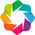

In [ ]:
import zarr
import numpy as np
import holoviews as hv
hv.extension('bokeh')
hv.output(widget_location='bottom')
from bokeh.models import WheelZoomTool
from holoviews import opts

In [ ]:
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
intf = rslc_zarr[:,:,7]*rslc_zarr[:,:,13].conj()

In [ ]:
rslc_zarr = zarr.open('../../../William_Sound/split/2019/load_data/rslc.zarr/',mode='r')
intf = rslc_zarr[5000:5500,5000:5500,0]*rslc_zarr[5000:5500,5000:5500,1].conj()

In [ ]:
%%time
filtered_intf = n2f(intf,depths=(10,10))

CPU times: user 9.16 s, sys: 480 ms, total: 9.64 s
Wall time: 867 ms


In [ ]:
raw_intf_plot = mr.ras_plot(np.angle(intf))
filtered_intf_plot = mr.ras_plot(np.angle(filtered_intf))
(raw_intf_plot+filtered_intf_plot).opts(
    opts.Image(
        cmap='colorwheel',width=600, height=600, colorbar=True,invert_yaxis=True,
        default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
        active_tools=['wheel_zoom'])
)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (z)

In [ ]:
#| hide
if is_cuda_available():
    intf_cp = cp.asarray(intf)
    filtered_intf_cp = n2f(intf_cp)
    np.testing.assert_array_equal(np.isnan(intf),np.isnan(filtered_intf))
    np.testing.assert_array_equal(np.isnan(filtered_intf_cp.get()),np.isnan(filtered_intf))
    # filtered_intf at some pixels between cpu one and gpu one can be very different

In [ ]:
#| export
def _n2f_np_in_gpu(
    intf:np.ndarray, # interferogram, 2d np.complex64 or cp.complex64
    chunks:tuple=None, # chunksize, intf.shape by default 
    depths:tuple=(0,0), # width of the boundary
    model:str=None, # path to the model in onnx format, use the model comes with this package by default
):
    '''compare with n2f, input and output are np.ndarray but use gpu for inference'''
    if model is None:
        model = importlib.resources.files('moraine')/'dl_model/n2f.onnx'
    shape = intf.shape
    if chunks is None: chunks = shape
    in_slices, out_slices, map_slices = chunkwise_slicing_mapping(shape,chunks,depths)
    out = np.empty_like(intf)
    intf[np.abs(intf)<1e-30] = np.nan+1j*np.nan # in case gamma has nan value, should be done in the load gamma function and remove in the future.

    session = _ort_session(model,cuda=True)
    for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
        #out[out_slice] = _infer_n2f_cpu(intf[in_slice],session)[map_slice]

        out[out_slice] = _infer_n2f_gpu(cp.asarray(intf[in_slice]),session)[map_slice].get()
    return out

In [ ]:
#| hide
if is_cuda_available():
    filtered_intf_ = _n2f_np_in_gpu(intf)
    raw_intf_plot = mr.ras_plot(np.angle(intf))
    filtered_intf_plot = mr.ras_plot(np.angle(filtered_intf_))
(raw_intf_plot+filtered_intf_plot).opts(
        opts.Image(
            cmap='colorwheel',width=600, height=600, colorbar=True,invert_yaxis=True,
            default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
            active_tools=['wheel_zoom'])
)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (z)

In [ ]:
#| export
@ngpjit
def _pre_infer_n2fs3d_numba(adi,intf):
    nlines, width = intf.shape
    out = np.empty((1,3,nlines,width),dtype=np.float32)
    mask = np.empty((nlines,width),dtype=np.bool_)
    for i in prange(nlines):
        for j in prange(width):
            intf_i_j = intf[i,j]
            adi_i_j = adi[i,j]
            if math.isnan(intf_i_j.real) or math.isnan(adi_i_j):
                mask[i,j] = True
                out[0,0,i,j] = 1.0
                random_phase = random.uniform(-math.pi,math.pi)
                out[0,1,i,j] = math.cos(random_phase)
                out[0,2,i,j] = math.sin(random_phase)
            else:
                mask[i,j] = False
                out[0,0,i,j] = adi_i_j
                amp = abs(intf_i_j)
                out[0,1,i,j] = intf_i_j.real/amp
                out[0,2,i,j] = intf_i_j.imag/amp
    return out, mask

In [ ]:
#| export
if is_cuda_available():
    _pre_infer_n2fs3d_kernel = cp.ElementwiseKernel(
            'raw float32 adi, raw T intf, int32 nlines, int32 width',
            'raw float32 out, raw bool mask',
            '''
            int npixels = nlines*width;
            if (i >= npixels) return;

            //int az = i/width;
            //int r = i-az*width;
            T intf_i = intf[i];
            float adi_i = adi[i];
            if (isnan(intf_i.real())||isnan(adi_i) ){
                mask[i] = true;
                out[i] = 1.0;
            }
            else{
                mask[i] = false;
                float amp = abs(intf_i);
                out[i] = adi_i;
                out[npixels+i] = intf_i.real()/amp;
                out[2*npixels+i] = intf_i.imag()/amp;
            }
            ''',
            #preamble = '#include "curand.h"',
            # I do not find an easy way to generate random number with cupy kernel
            name = 'pre_infer_n2f_kernel',no_return=True)

In [ ]:
#| export
if is_cuda_available():
    def _pre_infer_n2fs3d_cp(adi,intf):
        nlines, width = intf.shape
        out = cp.empty((1,3,nlines,width),dtype=cp.float32)
        mask = cp.empty((nlines,width),dtype=cp.bool_)
        _pre_infer_n2fs3d_kernel(adi,intf,cp.int32(nlines),cp.int32(width),out,mask,size=nlines*width,block_size=128)
        nan_pos = cp.where(mask)
        random_phase = cp.random.uniform(-cp.pi,cp.pi,len(nan_pos[0]))
        out[0,1,nan_pos[0],nan_pos[1]] = cp.cos(random_phase)
        out[0,2,nan_pos[0],nan_pos[1]] = cp.sin(random_phase)
        return out, mask

In [ ]:
#| hide
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
test_img_complex = rslc_zarr[:,:,0]*rslc_zarr[:,:,1].conj()
adi = zarr.open('../CLI/ps/adi.zarr/',mode='r')[:]

In [ ]:
#| hide
intf, mask = _pre_infer_n2fs3d_numba(adi,test_img_complex)
intf_ = test_img_complex*(1/abs(test_img_complex))
intf_ = np.stack((adi,intf_.real,intf_.imag))[None,...]
np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_[:,:,~mask])

In [ ]:
#| hide
if is_cuda_available():
    intf_cp, mask_cp = _pre_infer_n2fs3d_cp(cp.asarray(adi),cp.asarray(test_img_complex))
    np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_cp[:,:,~mask_cp].get())
    np.testing.assert_array_equal(mask,mask_cp.get())

In [ ]:
#| hide
# test for n2f3d after_infer
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
test_img_complex = rslc_zarr[:,:,2]*rslc_zarr[:,:,14].conj()
adi = zarr.open('../CLI/ps/adi.zarr/',mode='r')[:]

In [ ]:
#| hide
intf, mask = _pre_infer_n2fs3d_numba(adi,test_img_complex)
out = _after_infer_n2f_numba(intf[:,1:,:,:],mask)
np.testing.assert_array_almost_equal(np.angle(test_img_complex),np.angle(out))

In [ ]:
#| hide
if is_cuda_available():
    out_cp = _after_infer_n2f_cp(cp.asarray(intf[:,1:,:,:]),cp.asarray(mask))
    np.testing.assert_array_almost_equal(np.angle(test_img_complex),np.angle(out_cp.get()))

In [ ]:
#| hide
if is_cuda_available():
    intf_cp, mask_cp = _pre_infer_n2fs3d_cp(cp.asarray(adi),cp.asarray(test_img_complex))
    np.testing.assert_array_almost_equal(intf[:,:,~mask],intf_cp[:,:,~mask_cp].get())
    np.testing.assert_array_equal(mask,mask_cp.get())

In [ ]:
#| export
def _infer_n2fs3d_cpu(
    adi,
    intf,
    session,
):
    input_intf, mask = _pre_infer_n2fs3d_numba(adi,intf)
    infer_out = session.run([session.get_outputs()[0].name,],{session.get_inputs()[0].name: input_intf})[0]
    return _after_infer_n2f_numba(infer_out,mask)

In [ ]:
#| export
def _infer_n2fs3d_gpu(
    adi,
    intf,
    session,
):
    input_intf, mask = _pre_infer_n2fs3d_cp(adi,intf)
    input_intf = cp.ascontiguousarray(input_intf)
    out = cp.ascontiguousarray(cp.empty((1,2,*mask.shape),dtype=input_intf.dtype))
    io_binding = session.io_binding()
    io_binding.bind_input(
            name=session.get_inputs()[0].name,
            device_type='cuda',
            device_id=input_intf.device.id,
            element_type=input_intf.dtype,
            shape=list(input_intf.shape),
            buffer_ptr=input_intf.data.ptr,
    )
    io_binding.bind_output(
            name=session.get_outputs()[0].name,
            device_type='cuda',
            device_id=out.device.id,
            element_type=out.dtype,
            shape=list(out.shape),
            buffer_ptr=out.data.ptr,
    )
    io_binding.synchronize_inputs()
    session.run_with_iobinding(io_binding)
    return _after_infer_n2f_cp(out,mask)

In [ ]:
#| export
def n2fs3d(
    adi:np.ndarray, # amplitude dispersion index, 2d np.float32 or cp.float32
    intf:np.ndarray, # interferogram, 2d np.complex64 or cp.complex64
    chunks:tuple=None, # chunksize, intf.shape by default 
    depths:tuple=(0,0), # width of the boundary
    model:str=None, # path to the model in onnx format, use the model comes with this package by default
):
    xp = mr.utils_.get_array_module(intf)
    if model is None:
        model = importlib.resources.files('moraine')/'dl_model/n2fs3d.onnx'
    shape = intf.shape
    if chunks is None: chunks = shape
    in_slices, out_slices, map_slices = chunkwise_slicing_mapping(shape,chunks,depths)
    out = xp.empty_like(intf)
    intf[xp.abs(intf)<1e-30] = xp.nan+1j*xp.nan # in case gamma has nan value, should be done in the load gamma function and remove in the future.

    if xp is np:
        session = _ort_session(model,cuda=False)
        for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
            out[out_slice] = _infer_n2fs3d_cpu(adi[in_slice],intf[in_slice],session)[map_slice]
    else:
        session = _ort_session(model,cuda=True)
        for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
            out[out_slice] = _infer_n2fs3d_gpu(adi[in_slice],intf[in_slice],session)[map_slice]

    return out

Usage:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
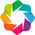

In [ ]:
import zarr
import numpy as np
import holoviews as hv
hv.extension('bokeh')
hv.output(widget_location='bottom')
from bokeh.models import WheelZoomTool
from holoviews import opts

In [ ]:
rslc_zarr = zarr.open('../CLI/raw/rslc.zarr/',mode='r')
intf = rslc_zarr[:,:,7]*rslc_zarr[:,:,13].conj()
adi = zarr.open('../CLI/ps/adi.zarr/',mode='r')[:]

In [ ]:
%%time
filtered_intf = n2fs3d(adi,intf,depths=(200,200))

CPU times: user 2min 39s, sys: 11.7 s, total: 2min 51s
Wall time: 6.68 s


In [ ]:
%%time
if is_cuda_available():
    intf_cp = cp.asarray(intf)
    adi_cp = cp.asarray(adi)
    filtered_intf_cp = n2fs3d(adi_cp,intf_cp)

CPU times: user 1 s, sys: 189 ms, total: 1.19 s
Wall time: 535 ms


In [ ]:
#| hide
if is_cuda_available():
    raw_intf_plot = mr.ras_plot(np.angle(intf))
    filtered_intf_plot = mr.ras_plot(np.angle(filtered_intf_cp.get()))
(raw_intf_plot+filtered_intf_plot).opts(
    opts.Image(
        cmap='colorwheel',width=600, height=600, colorbar=True,invert_yaxis=True,
        default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
        active_tools=['wheel_zoom'])
)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (z)

In [ ]:
#| hide
np.testing.assert_array_equal(np.isnan(intf),np.isnan(filtered_intf))
np.testing.assert_array_equal(np.isnan(filtered_intf_cp.get()),np.isnan(filtered_intf))
# filtered_intf at some pixels between cpu one and gpu one can be very different

In [ ]:
#| export
def _n2fs3d_np_in_gpu(
    adi:np.ndarray, # adi, 2d np.float32
    intf:np.ndarray, # interferogram, 2d np.complex64 or cp.complex64
    chunks:tuple=None, # chunksize, intf.shape by default 
    depths:tuple=(0,0), # width of the boundary
    model:str=None, # path to the model in onnx format, use the model comes with this package by default
):
    '''compare with n2f, input and output are np.ndarray but use gpu for inference'''
    if model is None:
        model = importlib.resources.files('moraine')/'dl_model/n2fs3d.onnx'
    shape = intf.shape
    if chunks is None: chunks = shape
    in_slices, out_slices, map_slices = chunkwise_slicing_mapping(shape,chunks,depths)
    out = np.empty_like(intf)
    intf[np.abs(intf)<1e-30] = np.nan+1j*np.nan # in case gamma has nan value, should be done in the load gamma function and remove in the future.

    session = _ort_session(model,cuda=True)
    for in_slice, out_slice, map_slice in zip(in_slices, out_slices, map_slices):
        out[out_slice] = _infer_n2fs3d_gpu(cp.asarray(adi[in_slice]),cp.asarray(intf[in_slice]),session)[map_slice].get()
    return out

In [ ]:
#| hide
if is_cuda_available():
    filtered_intf_ = _n2fs3d_np_in_gpu(adi,intf)
    raw_intf_plot = mr.ras_plot(np.angle(intf))
    filtered_intf_plot = mr.ras_plot(np.angle(filtered_intf_))
(raw_intf_plot+filtered_intf_plot).opts(
        opts.Image(
            cmap='colorwheel',width=600, height=600, colorbar=True,invert_yaxis=True,
            default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
            active_tools=['wheel_zoom'])
)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (z)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (z)

In [ ]:
#| export
@ngpjit
def _weights(dd):
    N, K = dd.shape #(N, 3)
    out = np.empty_like(dd)
    for i in prange(N):  # OpenMP-style parallel loop
        denom = 0.0
        for j in range(K):
            out[i, j] = 1.0 / (dd[i, j] + 1e-8)
            denom += out[i, j]
        for j in range(K):
            out[i, j] /= denom
    return out

In [ ]:
#| export
def _sample_and_knn(pos, k=16, workers=-1):  # (N, 2)
    N0 = pos.shape[0]
    N1 = N0 // 4
    N2 = N1 // 4
    N3 = N2 // 4

    p0 = pos  # [N0, 2]
    idx01 = fpsample.bucket_fps_kdtree_sampling(p0, N1)
    p1 = p0[idx01]
    idx12 = fpsample.bucket_fps_kdtree_sampling(p1, N2)
    p2 = p1[idx12]
    idx23 = fpsample.bucket_fps_kdtree_sampling(p2, N3)
    p3 = p2[idx23]

    tree0 = KDTree(p0)
    tree1 = KDTree(p1)
    tree2 = KDTree(p2)
    tree3 = KDTree(p3)

    # KNN queries
    _, ii_00 = tree0.query(p0, k=k, workers=workers) #[N0, k]
    _, ii_01 = tree0.query(p1, k=k, workers=workers) #[N1, k]
    _, ii_11 = tree1.query(p1, k=k, workers=workers)
    _, ii_12 = tree1.query(p2, k=k, workers=workers)
    _, ii_22 = tree2.query(p2, k=k, workers=workers)
    _, ii_23 = tree2.query(p3, k=k, workers=workers)
    _, ii_33 = tree3.query(p3, k=k, workers=workers)

    dd_10, ii_10 = tree1.query(p0, k=3, workers=workers)
    dd_21, ii_21 = tree2.query(p1, k=3, workers=workers)
    dd_32, ii_32 = tree3.query(p2, k=3, workers=workers)

    ww_10 = _weights(dd_10).astype(np.float32)
    ww_21 = _weights(dd_21).astype(np.float32)
    ww_32 = _weights(dd_32).astype(np.float32)

    return (
        ii_00, ii_01, ii_11, ii_12, ii_22, ii_23, ii_33,
        ii_10, ii_21, ii_32,
        ww_10, ww_21, ww_32
    )

In [ ]:
#| export
@ngpjit
def _pos_norm(x, y): # (N,), (N,)
    '''return normalized pos, (N, 2)'''
    y_min, y_max = np.min(y), np.max(y)
    x_min, x_max = np.min(x), np.max(x)
    y_norm = (y - y_min)/(y_max - y_min)
    x_norm = (x - x_min)/(x_max - x_min)

    return np.stack((x_norm, y_norm),axis=-1).astype(np.float32)

In [ ]:
#| export
@ngpjit
def _complex2channel(intf):
    # convert 1d complex array to 2 column
    n = intf.shape[0]
    out = np.empty((n,2),dtype=np.float32)
    for i in prange(n):
        amp_i = abs(intf[i])
        out[i,0] = intf[i].real/amp_i
        out[i,1] = intf[i].imag/amp_i
    return out

In [ ]:
#| export
@ngpjit
def _2channel2complex(intf):
    # convert (n,2) to (n,) complex array
    n = intf.shape[0]
    out = np.empty(n,dtype=np.complex64)
    for i in prange(n):
        out[i] = intf[i,0]+intf[i,1]*1j
    return out

In [ ]:
#| export
def _infer_n2ft(
    x,
    y,
    intf,
    session,
):
    pos = _pos_norm(x,y)
    keys = _sample_and_knn(pos)

    pos = pos[None,...]
    keys = tuple(key[None,...] for key in keys)
    intf = _complex2channel(intf)[None,...]

    inputs = (pos, intf) + keys
    input_names = [input.name for input in session.get_inputs()]
    inputs = dict(zip(input_names, inputs))
    infer_out = session.run([session.get_outputs()[0].name,], inputs)[0][0]

    filt_intf = _2channel2complex(infer_out)
    return filt_intf

In [ ]:
#| export
def n2ft(
    x:np.ndarray, # x coordinate, e.g., longitude, shape (n,) np.floating
    y:np.ndarray, # y coordinate, e.g., latitude, shape (n,) np.floating
    intf:np.ndarray, # interferogram, shape(n,) np.complex64
    chunks:int=None, # chunksize, intf.shape[0] by default 
    k:int=128, # halo size for chunkwise processing
    model:str=None, # path to the model in onnx format, use the model comes with this package by default
    cuda:bool=False # use gpu for inference
):
    xp = np #mr.utils_.get_array_module(intf) # probability will add support for input and output with cupy array
    if model is None:
        model = importlib.resources.files('moraine')/'dl_model/n2ft.onnx'
    if cuda:
        session = _ort_session(model,cuda=True)
    else:
        session = _ort_session(model,cuda=False)
    
    n = intf.shape[0]
    if (chunks is None) or (chunks >= n):
        out = _infer_n2ft(x, y, intf, session)
    else:
        out = xp.empty_like(intf)
        in_indices, out_slices, map_indices = chunkwise_knn_mapping(x, y, chunks, k=k)
        for in_idx, out_slice, map_idx in zip(in_indices, out_slices, map_indices):
            out[out_slice] = _infer_n2ft(x[in_idx],y[in_idx],intf[in_idx],session)[map_idx]

    return out

Usage:

In [ ]:
import zarr

In [ ]:
base = '../Tutorials/CLI/ps_processing/'
ps_can_rslc_zarr = zarr.open(base+'hix/ps_can_rslc.zarr/',mode='r')
ps_can_y = zarr.open(base+'hix/ps_can_n.zarr',mode='r')[:]
ps_can_x = zarr.open(base+'hix/ps_can_e.zarr',mode='r')[:]
ps_can_lon = zarr.open(base+'hix/ps_can_lon.zarr',mode='r')[:]
ps_can_lat = zarr.open(base+'hix/ps_can_lat.zarr',mode='r')[:]
ps_can_intf = ps_can_rslc_zarr[:,10]*ps_can_rslc_zarr[:,13].conj()

In [ ]:
%%time
out = n2ft(ps_can_lon, ps_can_lat, ps_can_intf,)

CPU times: user 1min 56s, sys: 13.9 s, total: 2min 10s
Wall time: 12.8 s


In [ ]:
%%time
out = n2ft(ps_can_lon, ps_can_lat, ps_can_intf, chunks=50000, cuda=True)

CPU times: user 9.11 s, sys: 2.23 s, total: 11.3 s
Wall time: 12.8 s


In [ ]:
%%time
out = n2ft(ps_can_lon, ps_can_lat, ps_can_intf, chunks=20000)

CPU times: user 5min 14s, sys: 4.76 s, total: 5min 19s
Wall time: 14.9 s


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
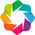

In [ ]:
import moraine as mr
import holoviews as hv
import numpy as np
import zarr
from holoviews import opts
from bokeh.models import WheelZoomTool
hv.extension('bokeh')

In [ ]:
intf_plot = mr.pc_plot(np.angle(ps_can_intf),ps_can_y,ps_can_x)
intf_plot = intf_plot[0]*intf_plot[1]
intf_filt_plot = mr.pc_plot(np.angle(out),ps_can_y,ps_can_x)
intf_filt_plot = intf_filt_plot[0]*intf_filt_plot[1]

In [ ]:
intf_plot = intf_plot.redim(
    x=hv.Dimension('lon', label='Longitude'), y=hv.Dimension('lat',label='Latitude'),
    z=hv.Dimension('intf',label='Phase',range=(-np.pi,np.pi)),
)
intf_filt_plot = intf_filt_plot.redim(
    x=hv.Dimension('lon', label='Longitude'), y=hv.Dimension('lat',label='Latitude'),
    z=hv.Dimension('intf',label='Phase',range=(-np.pi,np.pi)),
)

In [ ]:
(intf_plot+intf_filt_plot).opts(
    opts.Image(
        cmap='colorwheel',width=600, height=400, colorbar=True,
        default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
        active_tools=['wheel_zoom']
    ),
    opts.Points(
        color='intf', cmap='colorwheel',width=600, height=400, colorbar=True,
        default_tools=['pan',WheelZoomTool(zoom_on_axis=False),'save','reset','hover'],
        active_tools=['wheel_zoom']
    )
)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Overlay
         .Image.I  :Image   [lon,lat]   (Phase,idx)
         .Points.I :Points   [lon,lat]   (Phase,idx)
   .DynamicMap.II :DynamicMap   []
      :Overlay
         .Image.I  :Image   [lon,lat]   (Phase,idx)
         .Points.I :Points   [lon,lat]   (Phase,idx)

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()